In [512]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import xticks

%matplotlib inline

pd.set_option("display.max_columns", 500)
pd.set_option("display.max_rows", 1000)

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
from sklearn.feature_selection import RFE


## Read Data and Inspect

In [242]:
housing = pd.read_csv("train.csv", index_col='Id')

In [244]:
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [245]:
# check for Duplicates
housing.duplicated().sum()

0

* No Duplicate value found

In [246]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-null object
Exterior2nd      1460 non-

In [247]:
housing.shape

(1460, 80)

In [248]:
housing.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [249]:
val = round((housing.isnull().sum()/len(housing.index))*100,2)
val.sort_values(ascending=False)

PoolQC           99.52
MiscFeature      96.30
Alley            93.77
Fence            80.75
FireplaceQu      47.26
LotFrontage      17.74
GarageType        5.55
GarageCond        5.55
GarageFinish      5.55
GarageQual        5.55
GarageYrBlt       5.55
BsmtFinType2      2.60
BsmtExposure      2.60
BsmtQual          2.53
BsmtCond          2.53
BsmtFinType1      2.53
MasVnrArea        0.55
MasVnrType        0.55
Electrical        0.07
RoofMatl          0.00
Exterior1st       0.00
RoofStyle         0.00
ExterQual         0.00
Exterior2nd       0.00
YearBuilt         0.00
ExterCond         0.00
Foundation        0.00
YearRemodAdd      0.00
SalePrice         0.00
OverallCond       0.00
OverallQual       0.00
HouseStyle        0.00
BldgType          0.00
Condition2        0.00
Condition1        0.00
Neighborhood      0.00
LandSlope         0.00
LotConfig         0.00
Utilities         0.00
LandContour       0.00
LotShape          0.00
Street            0.00
LotArea           0.00
MSZoning   

In [250]:
# Fetching Categorical Columns
cat_cols = housing.select_dtypes(include='object').columns
# Fetching Numerical Columns
num_cols = housing.select_dtypes(exclude='object').columns

In [251]:
len(cat_cols)

43

In [252]:
len(num_cols)

37

## Univariate Analysis

* Numerical Columns

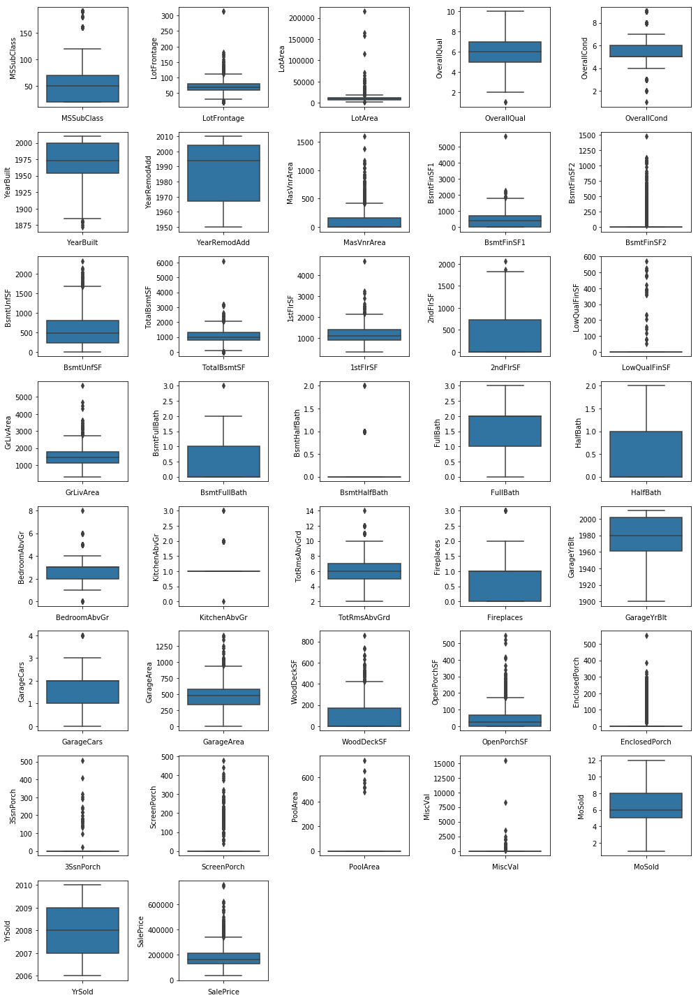

In [253]:
fig = plt.figure(figsize=(14,20))
for i in range(len(num_cols)):
    fig.add_subplot(8,5,i+1)
    sns.boxplot(y=housing[num_cols].iloc[:,i])
    plt.xlabel(num_cols[i])
plt.tight_layout()
plt.show()

* We can see there are lots of features with outliers. We shall treat the outliers after finalizing the columns that would stay in the model or during Feature selection phase

* Categorical columns

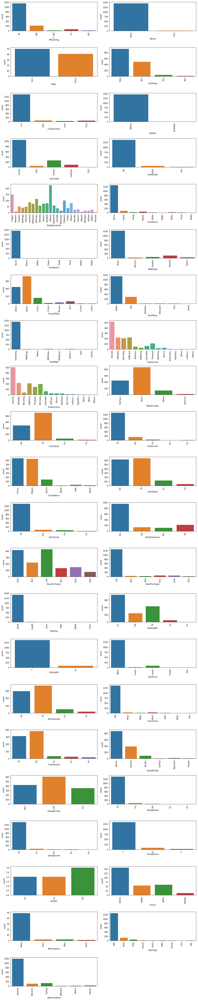

In [254]:
fig = plt.figure(figsize=(14,70))
for i in range(len(cat_cols)):
    fig.add_subplot(22,2,i+1)
    sns.countplot(housing[cat_cols].iloc[:,i])
    plt.xticks(rotation=90)
    plt.xlabel(cat_cols[i])
plt.tight_layout()
plt.show()

## Bivariate Analysis

* Categorical Columns

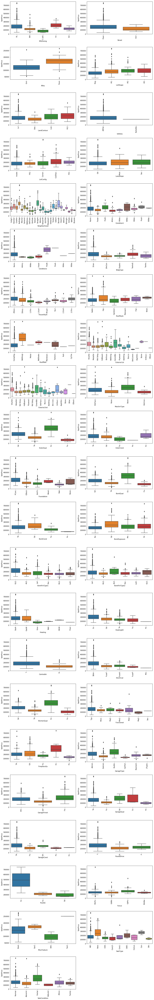

In [255]:
fig = plt.figure(figsize=(14,90))
for i in range(len(cat_cols)):
    fig.add_subplot(22,2,i+1)
    sns.boxplot(x=housing[cat_cols].iloc[:,i], y=housing.SalePrice)
    plt.xticks(rotation=90)
    plt.xlabel(cat_cols[i])
plt.tight_layout()
plt.show()

* Numerical Columns

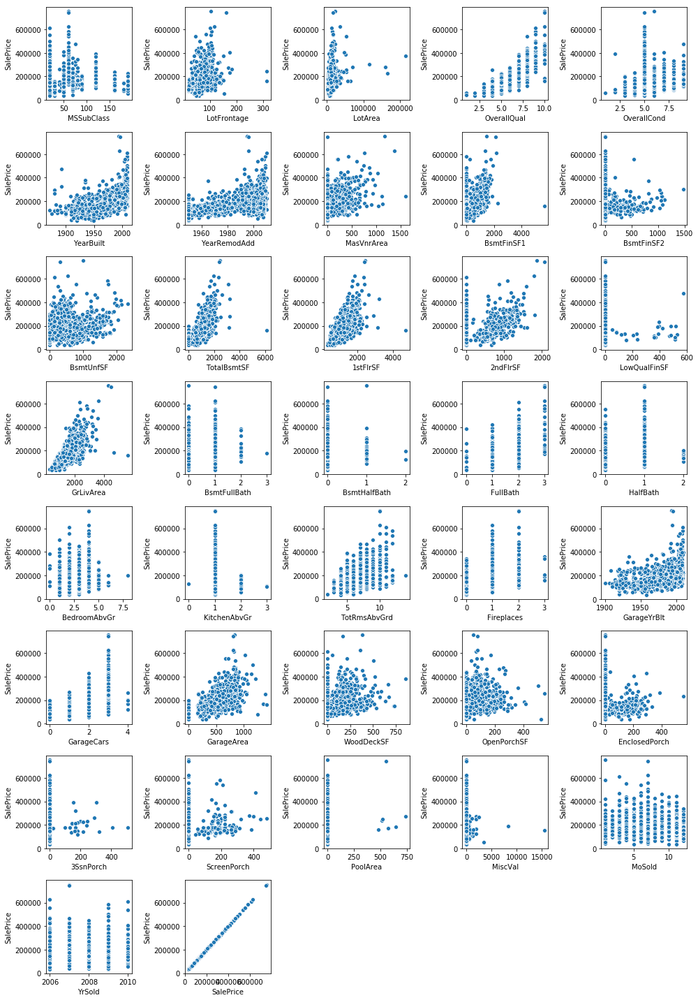

In [256]:
fig = plt.figure(figsize=(14,20))
for i in range(len(num_cols)):
    fig.add_subplot(8,5,i+1)
    sns.scatterplot(x=housing[num_cols].iloc[:,i], y=housing.SalePrice)
    plt.xlabel(num_cols[i])
plt.tight_layout()
plt.show()

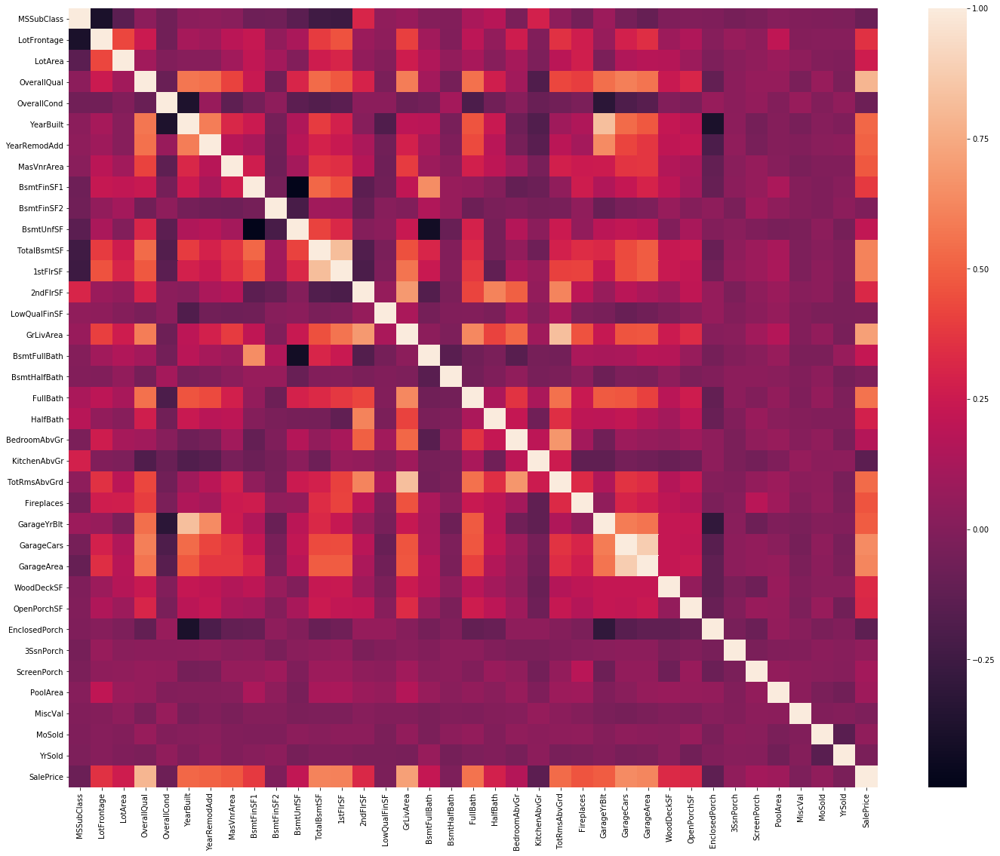

In [257]:
fig = plt.figure(figsize=(24,19))
sns.heatmap(housing.corr())


* Find out the coorelation ranking with the target variable(Sale Price)

In [258]:
house_cor = housing.corr()
house_cor['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64

* We see from th heat map that quite a few features are higly correlated with each other and hence if they capture the same information we can drop one of them which have lower correlation % with the target variable(SalePrice).
    - TotRmsAbvGrd and GrLivArea are highly correlated with each other and since GrLivArea is ~70% correlated with saleprice as compared to TotRmsAbvGrd which is 53% correlated with SalePrice. We can drop TotRmsAbvGrd.
    - GarageCars and GarageArea are highly correlated with each other and since GarageCars is ~64% correlated with saleprice as compared to GarageArea which is 62% correlated with SalePrice. We can drop GarageArea.
    - GarageYrBlt and YearBuilt are highly correlated with each other and since GarageYrBlt is ~48% correlated with saleprice as compared to YearBuilt which is 52% correlated with SalePrice. We can drop GarageYrBlt.
    - TotalBsmtSF and 1stFlrSF are highly correlated with each other and since TotalBsmtSF is ~61% correlated with saleprice as compared to 1stFlrSF which is 60% correlated with SalePrice. We can drop 1stFlrSF.

In [259]:
# copy of primary dataset
housing1 = housing.copy()

In [261]:
housing1.drop(columns=['TotRmsAbvGrd', 'GarageArea', 'GarageYrBlt', '1stFlrSF'], inplace=True)

## Treating Missing Values, Data Cleanup and Outlier treatment

In [262]:
val = round((housing1.isnull().sum()/len(housing1.index))*100,2)
val.sort_values(ascending=False).head(25)

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageCond       5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtCond         2.53
BsmtQual         2.53
BsmtFinType1     2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
Utilities        0.00
YearRemodAdd     0.00
MSZoning         0.00
Foundation       0.00
ExterCond        0.00
ExterQual        0.00
Exterior2nd      0.00
dtype: float64

* Following columns have missing values which can be imputed with 'None' value.

In [263]:
miss_cols = ['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
       'GarageType', 'GarageCond', 'GarageFinish', 'GarageQual',
       'BsmtFinType2', 'BsmtExposure', 'BsmtQual', 'BsmtCond', 'BsmtFinType1',
       'MasVnrType']

housing1[miss_cols] = housing1[miss_cols].fillna("None")

* Replacing LotFrontage missing values with 0.0 considering all the NaN values corresponds to the houses which doesn't have Lot-Frontage.

In [264]:
housing1['LotFrontage'] = housing1['LotFrontage'].fillna(0.0)

In [265]:
val = round((housing1.isnull().sum()/len(housing1.index))*100,2)
val.sort_values(ascending=False).head(25)

MasVnrArea      0.55
Electrical      0.07
SalePrice       0.00
ExterCond       0.00
RoofStyle       0.00
RoofMatl        0.00
Exterior1st     0.00
Exterior2nd     0.00
MasVnrType      0.00
ExterQual       0.00
Foundation      0.00
BsmtUnfSF       0.00
BsmtQual        0.00
BsmtCond        0.00
BsmtExposure    0.00
BsmtFinType1    0.00
BsmtFinSF1      0.00
BsmtFinType2    0.00
YearRemodAdd    0.00
YearBuilt       0.00
OverallCond     0.00
OverallQual     0.00
MSZoning        0.00
LotFrontage     0.00
LotArea         0.00
dtype: float64

* Replacing MasVnrArea missing values with 0.0 considering all the NaN values corresponds to the houses which doesn't have MasVnrArea.

In [266]:
housing1['MasVnrArea'] = housing1['MasVnrArea'].fillna(0.0)

In [275]:
val = round((housing1.isnull().sum()/len(housing1.index))*100,2)
val.sort_values(ascending=False).head(25)

SalePrice        0.0
ExterCond        0.0
RoofStyle        0.0
RoofMatl         0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrType       0.0
MasVnrArea       0.0
ExterQual        0.0
Foundation       0.0
SaleCondition    0.0
BsmtQual         0.0
BsmtCond         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtFinType2     0.0
BsmtFinSF2       0.0
YearRemodAdd     0.0
YearBuilt        0.0
OverallCond      0.0
OverallQual      0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
dtype: float64

In [274]:
# Replace Electrical with the median.
housing1['Electrical'].fillna('FuseF', inplace=True)


In [276]:
# Some numerical columns like "MSSubClass" and "MoSold" are categorical. Converting them back to Categorical values.

housing1 = housing1.replace({'MSSubClass': {20 : 'MSSC20', 60 : 'MSSC60', 50 : 'MSSC50', 120 : 'MSSC120', 30 : 'MSSC30', 160 : 'MSSC160', 70 : 'MSSC70', 80 : 'MSSC80', 90 : 'MSSC90', 190 : 'MSSC190', 85 : 'MSSC85', 75 : 'MSSC75', 45 : 'MSSC45', 180 : 'MSSC180', 40 : 'MSSC40'},
                               'MoSold' : {1 : 'Jan', 2 : 'Feb', 3 : 'Mar', 4 : 'Apr', 5 : 'May', 6 : 'Jun', 7 : 'Jul', 8 : 'Aug', 9 : 'Sep', 10 : 'Oct', 11 : 'Nov', 12 : 'Dec'}
                               })





In [128]:
housing1.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,Foundation,BsmtExposure,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageCars,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Total_Home_Qual&Cond,Total_HomeExterior_Qual&Cond,Total_Bsmnt_Qual&Cond,Total_Bsmnt_Finish_TypeI&II,Total_Bsmnt_FinishedSQFeet_TypeI&II,Total_Bathrooms,Total_Garage_Qual&Cond
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,MSSC60,RL,65.0,8450,2,0,4,Lvl,2,Inside,3,CollgCr,Norm,Norm,1Fam,2Story,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,PConc,No,150,856,GasA,5,Y,SBrkr,854,0,1710,3,1,4,8,0,0,Attchd,2,2,0,61,0,0,0,0,0,None,None,0,Feb,2008,WD,Normal,208500,12,7,7,7,706,3.5,8
2,MSSC20,RL,80.0,9600,2,0,4,Lvl,2,FR2,3,Veenker,Feedr,Norm,1Fam,1Story,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,CBlock,Gd,284,1262,GasA,5,Y,SBrkr,0,0,1262,3,1,3,8,1,3,Attchd,2,2,298,0,0,0,0,0,0,None,None,0,May,2007,WD,Normal,181500,14,6,7,6,978,2.5,8
3,MSSC60,RL,68.0,11250,2,0,3,Lvl,2,Inside,3,CollgCr,Norm,Norm,1Fam,2Story,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,PConc,Mn,434,920,GasA,5,Y,SBrkr,866,0,1786,3,1,4,8,1,3,Attchd,2,2,0,42,0,0,0,0,0,None,None,0,Sep,2008,WD,Normal,223500,12,7,7,7,486,3.5,8
4,MSSC70,RL,60.0,9550,2,0,3,Lvl,2,Corner,3,Crawfor,Norm,Norm,1Fam,2Story,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,BrkTil,No,540,756,GasA,4,Y,SBrkr,756,0,1717,3,1,4,8,1,4,Detchd,3,2,0,35,272,0,0,0,0,None,None,0,Feb,2006,WD,Abnorml,140000,12,6,7,6,216,2.0,7
5,MSSC60,RL,84.0,14260,2,0,3,Lvl,2,FR2,3,NoRidge,Norm,Norm,1Fam,2Story,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,PConc,Av,490,1145,GasA,5,Y,SBrkr,1053,0,2198,4,1,4,8,1,3,Attchd,3,2,192,84,0,0,0,0,0,None,None,0,Dec,2008,WD,Normal,250000,13,7,7,7,655,3.5,8
6,MSSC50,RL,85.0,14115,2,0,3,Lvl,2,Inside,3,Mitchel,Norm,Norm,1Fam,1.5Fin,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,Wood,No,64,796,GasA,5,Y,SBrkr,566,0,1362,1,1,3,8,0,0,Attchd,2,2,40,30,0,320,0,0,0,MnPrv,Shed,700,Oct,2009,WD,Normal,143000,10,6,7,7,732,2.5,7
7,MSSC20,RL,75.0,10084,2,0,4,Lvl,2,Inside,3,Somerst,Norm,Norm,1Fam,1Story,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,PConc,Av,317,1686,GasA,5,Y,SBrkr,0,0,1694,3,1,4,8,1,4,Attchd,2,2,255,57,0,0,0,0,0,None,None,0,Aug,2007,WD,Normal,307000,13,7,8,7,1369,3.0,8
8,MSSC60,RL,0.0,10382,2,0,3,Lvl,2,Corner,3,NWAmes,PosN,Norm,1Fam,2Story,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,CBlock,Mn,216,1107,GasA,5,Y,SBrkr,983,0,2090,3,1,3,8,2,3,Attchd,2,2,235,204,228,0,0,0,0,None,Shed,350,Nov,2009,WD,Normal,200000,13,6,7,9,891,3.5,8
9,MSSC50,RM,51.0,6120,2,0,4,Lvl,2,Inside,3,OldTown,Artery,Norm,1Fam,1.5Fin,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,BrkTil,No,952,952,GasA,4,Y,FuseF,752,0,1774,2,2,3,7,2,3,Detchd,2,2,90,0,205,0,0,0,0,None,None,0,Apr,2008,WD,Abnorml,129900,12,6,6,2,0,2.0,6


In [277]:
# Encoding some of the categorical variables which seems to follow patterns of ordered categorical columns.
housing1 = housing1.replace({'Street' : {'Grvl' : 1, 'Pave' : 2},
                            'Alley' : {'None' : 0, 'Grvl' : 1, 'Pave' : 2},
                            'LotShape' : {'IR3' : 1, 'IR2' : 2, 'IR1' : 3, 'Reg' : 4},
                            'Utilities' : {'NoSeWa' : 1, 'AllPub' : 2},
                            'LandSlope' : {'Sev' : 1, 'Mod' : 2, 'Gtl' : 3},
                            'ExterQual' : {'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' :5},
                            'ExterCond' : {'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' :5},
                            'BsmtQual' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'BsmtCond' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'BsmtFinType1' : {"None" : 0, "Unf" : 1, "LwQ": 2, "Rec" : 3, "BLQ" : 4, "ALQ" : 5, "GLQ" : 6},
                            'BsmtFinType2' : {"None" : 0, "Unf" : 1, "LwQ": 2, "Rec" : 3, "BLQ" : 4, "ALQ" : 5, "GLQ" : 6},
                            'HeatingQC' : {'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'KitchenQual' : {'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'Functional' : {"Sal" : 1, "Sev" : 2, "Maj2" : 3, "Maj1" : 4, "Mod": 5, "Min2" : 6, "Min1" : 7, "Typ" : 8},
                            'FireplaceQu' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'GarageFinish' : {'None' : 0 , 'Unf' : 1, 'RFn' : 2, 'Fin' : 3},
                            'GarageQual' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'GarageCond' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                            'PavedDrive' : {'N' : 0, 'P' : 1 , 'Y' : 2},
                            'PoolQC' : {'None' : 0, 'Po' : 1 , 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}
                            })



In [278]:
# There are so many atomic features which can be clubbed to form a single derived feature.
housing1['Total_Home_Qual&Cond'] = housing1['OverallQual'] + housing1['OverallCond']
housing1['Total_HomeExterior_Qual&Cond'] = housing1['ExterQual'] + housing1['ExterCond']
housing1['Total_Bsmnt_Qual&Cond'] = housing1['BsmtQual'] + housing1['BsmtCond']
housing1['Total_Bsmnt_Finish_TypeI&II'] = housing1['BsmtFinType1'] + housing1['BsmtFinType2']
housing1['Total_Bsmnt_FinishedSQFeet_TypeI&II'] = housing1['BsmtFinSF1'] + housing1['BsmtFinSF2']
housing1['Total_Bathrooms'] = housing1['BsmtFullBath'] + housing1['BsmtHalfBath'] * 0.5 + housing1['FullBath'] + housing1['HalfBath'] * 0.5
housing1['Total_Garage_Qual&Cond'] = housing1['GarageQual'] + housing1['GarageCond'] + housing1['GarageFinish']



In [279]:
# Now that new derived features are created, we can drop original features as they'll be redundant columns.

housing1.drop(columns= ['OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual',
                        'BsmtCond','BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2',
                        'BsmtFullBath','BsmtHalfBath','FullBath','HalfBath',
                        'GarageQual','GarageCond','GarageFinish'], axis=1, inplace=True)


In [330]:
# Groupby Neighbourhood w.r.t SalePrice so that meaningfull grouping can be formed and Neighbourhood can be binned.
grpbyNeighborhood = housing1.groupby('Neighborhood')['SalePrice'].median()
grpbyNeighborhood


Neighborhood
Blmngtn    191000
Blueste    137500
BrDale     106000
BrkSide    124300
ClearCr    200250
CollgCr    197200
Crawfor    200624
Edwards    121750
Gilbert    181000
IDOTRR     103000
MeadowV     88000
Mitchel    153500
NAmes      140000
NPkVill    146000
NWAmes     182900
NoRidge    301500
NridgHt    315000
OldTown    119000
SWISU      139500
Sawyer     135000
SawyerW    179900
Somerst    225500
StoneBr    278000
Timber     228475
Veenker    218000
Name: SalePrice, dtype: int64

In [348]:
# Binning the Neighbourhood values

housing1 = housing1.replace({"Neighborhood" : {"MeadowV" : 0, "IDOTRR" : 0,"BrDale" : 0,
                                               "OldTown" : 0,"Edwards" : 0, "BrkSide" : 0,
                                               "Sawyer" : 0,"Blueste" : 1,"SWISU" : 1,"NAmes" : 1,
                                               "NPkVill" : 1,"Mitchel" : 1,"SawyerW" : 1,"Gilbert" : 2,
                                               "NWAmes" : 2,"Blmngtn" : 2,"CollgCr" : 2,
                                               "ClearCr" : 2,"Crawfor" : 2,"Veenker" : 3,"Somerst" : 3,
                                               "Timber" : 3,"StoneBr" : 3,"NoRidge" : 3,"NridgHt" : 3}})



(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

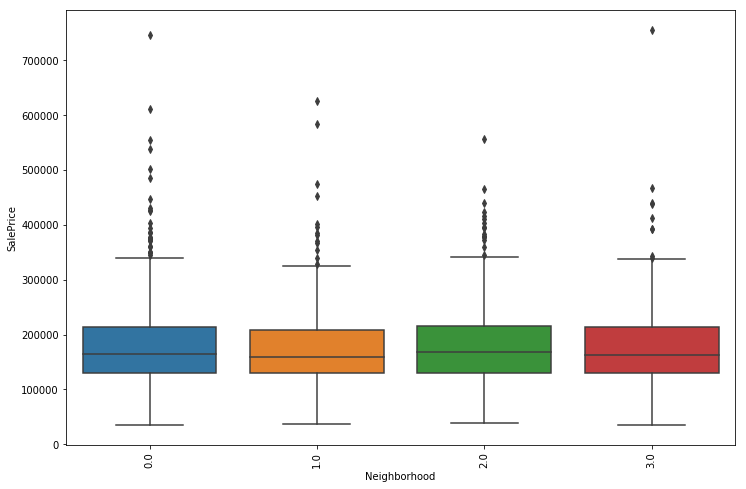

In [174]:
fig = plt.figure(figsize=(12,8))
sns.boxplot(y=housing.SalePrice, x=housing1.Neighborhood)
plt.xticks(rotation=90)

## Outlier Treatment

In [351]:
# Fetching Categorical Columns
cat_cols = housing1.select_dtypes(include='object').columns
# Fetching Numerical Columns
num_cols = housing1.select_dtypes(exclude='object').columns

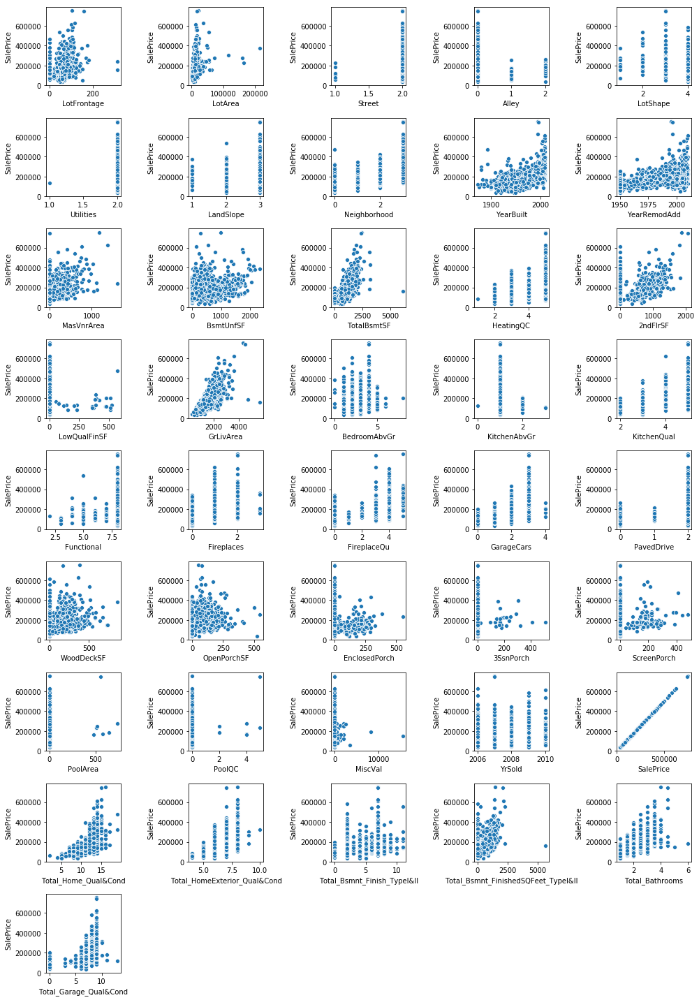

In [352]:
fig = plt.figure(figsize=(14,20))
for i in range(len(num_cols)):
    fig.add_subplot(9,5,i+1)
    sns.scatterplot(x=housing1[num_cols].iloc[:,i], y=housing1.SalePrice)
    plt.xlabel(num_cols[i])
plt.tight_layout()
plt.show()

### Based on the above scatter plots with respect to the Sale price, we can easily see that few of the features have outliers which was also clear from the earlier Box plot on raw dataset.
    - With increase in GrLivArea the Saleprice should increase. However we can see there are some outliers. Hence, topping the GrLivArea under 4500 Sqft.
    - Topping Total_Garage_Qual&Cond under 10
    - Total_Bathrooms under 5
    - BedroomAbvGr under 7

In [354]:
housing2 = housing1[housing1.GrLivArea < 4500]

In [355]:
housing3 = housing2[housing2['Total_Garage_Qual&Cond'] < 10]

In [356]:
housing4 = housing3[housing3['Total_Bathrooms'] < 5]

In [357]:
housing5 = housing4[housing4['BedroomAbvGr'] < 7]

### Final dataset has around 1449 rows Vs original dataset which has 1460 rows. After Feature Engineering, we still have 99.24% of data retained to proceed with Model Training.

In [358]:
housing5.shape[0]/housing1.shape[0]

0.9924657534246575

In [361]:
# Final check on the dataset to confirm the missing values.
val = round((housing5.isnull().sum()/len(housing5.index))*100,2)
val.sort_values(ascending=False).head(25)

Total_Garage_Qual&Cond    0.0
YearBuilt                 0.0
CentralAir                0.0
HeatingQC                 0.0
Heating                   0.0
TotalBsmtSF               0.0
BsmtUnfSF                 0.0
BsmtExposure              0.0
Foundation                0.0
MasVnrArea                0.0
MasVnrType                0.0
Exterior2nd               0.0
Exterior1st               0.0
RoofMatl                  0.0
RoofStyle                 0.0
YearRemodAdd              0.0
HouseStyle                0.0
Total_Bathrooms           0.0
BldgType                  0.0
Condition2                0.0
Condition1                0.0
Neighborhood              0.0
LandSlope                 0.0
LotConfig                 0.0
Utilities                 0.0
dtype: float64

In [373]:
housing5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1449 entries, 1 to 1460
Data columns (total 66 columns):
MSSubClass                             1449 non-null object
MSZoning                               1449 non-null object
LotFrontage                            1449 non-null float64
LotArea                                1449 non-null int64
Street                                 1449 non-null int64
Alley                                  1449 non-null int64
LotShape                               1449 non-null int64
LandContour                            1449 non-null object
Utilities                              1449 non-null int64
LotConfig                              1449 non-null object
LandSlope                              1449 non-null int64
Neighborhood                           1449 non-null int64
Condition1                             1449 non-null object
Condition2                             1449 non-null object
BldgType                               1449 non-null object

In [372]:
housing5['Total_Bsmnt_Qual&Cond'] = housing5['Total_Bsmnt_Qual&Cond'].astype(int)

In [374]:
# Categorical Features dataset
cat_cols = housing5.select_dtypes(include='object')
num_cols = housing5.select_dtypes(exclude='object')

In [375]:
# One hot encoding for the remaining categorical columns
cat_cols_data = pd.get_dummies(cat_cols, drop_first=True)

In [376]:
cat_cols_data

,MSSubClass_MSSC160,MSSubClass_MSSC180,MSSubClass_MSSC190,MSSubClass_MSSC20,MSSubClass_MSSC30,MSSubClass_MSSC40,MSSubClass_MSSC45,MSSubClass_MSSC50,MSSubClass_MSSC60,MSSubClass_MSSC70,MSSubClass_MSSC75,MSSubClass_MSSC80,MSSubClass_MSSC85,MSSubClass_MSSC90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,MoSold_Aug,MoSold_Dec,MoSold_Feb,MoSold_Jan,MoSold_Jul,MoSold_Jun,MoSold_Mar,MoSold_May,MoSold_Nov,MoSold_Oct,MoSold_Sep,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [378]:
housing6 = pd.concat([num_cols,cat_cols_data], axis=1)

In [387]:
housing6.shape

(1449, 193)

## Model Building And Evaluation

In [422]:
X = housing6.drop('SalePrice', axis=1)
y = housing6.SalePrice

In [423]:
# Splitting the data into train test split
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y, train_size=0.7, test_size=0.3, random_state=100)


In [424]:
# Feature Scalling
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train.iloc[:,:41] = sc.fit_transform(X_train.iloc[:,:41])
X_test.iloc[:,:41] = sc.transform(X_test.iloc[:,:41])

## Linear Regression without Regularization

In [484]:
lm = LinearRegression()
lm.fit(X_train, y_train)
lm_train_predict = lm.predict(X_train)
print(r2_score(y_train, lm_train_predict))
lm_test_predict = lm.predict(X_test)
print(r2_score(y_test, lm_test_predict))

0.9231380228707003
-6.942729661838757e+19


* Clearly General Linear regression seem to have overfit, and that;s the reason we get such a good result in train set however the model fails miserably in test set

## Ridge Regression

In [425]:
# list of alphas to tune hyperparameter
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [450]:
ridge = Ridge()

# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# Cross validations
ridge_model_cv = GridSearchCV(estimator=ridge,
                              param_grid=params,
                              scoring='neg_mean_absolute_error',
                              cv=folds,
                              verbose=1,
                              return_train_score=True)
ridge_model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    1.7s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
       error_score='raise',
       estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_absolute_error', verbose=1)

In [452]:
cv_results = pd.DataFrame(ridge_model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010472,0.000687,0.001131,0.000120,0.0001,{'alpha': 0.0001},-20932.525940,-19542.089348,-20173.711280,-20536.783821,-23069.133417,-20848.661104,1198.354794,28,-14806.411917,-15109.442487,-14856.487514,-14852.286982,-13910.212678,-14706.968316,412.351195
1,0.009411,0.000392,0.001042,0.000051,0.001,{'alpha': 0.001},-20923.862799,-19519.490445,-20165.670627,-20534.209397,-23056.741841,-20837.808881,1199.650758,27,-14807.312512,-15109.555302,-14856.820823,-14852.719022,-13911.376607,-14707.556853,412.021532
2,0.010063,0.000470,0.001026,0.000071,0.01,{'alpha': 0.01},-20844.242758,-19344.908438,-20096.371271,-20509.408577,-22951.741859,-20747.162581,1208.239790,26,-14814.987025,-15112.134158,-14863.882097,-14856.867093,-13931.915238,-14715.957122,405.764035
3,0.010356,0.001116,0.001099,0.000057,0.05,{'alpha': 0.05},-20621.521847,-18985.086438,-19902.839105,-20421.625897,-22689.082551,-20521.896008,1220.318928,25,-14845.544774,-15143.205283,-14900.533810,-14891.340342,-13993.009558,-14754.726753,394.790966
4,0.009506,0.000624,0.001059,0.000010,0.1,{'alpha': 0.1},-20449.088317,-18810.959067,-19771.165836,-20325.672053,-22524.223823,-20374.103474,1218.398898,23,-14874.032822,-15188.868091,-14938.878820,-14931.406264,-14044.421312,-14795.521462,390.909977
5,0.009137,0.001442,0.000963,0.000173,0.2,{'alpha': 0.2},-20194.358520,-18721.918208,-19703.639494,-20165.722041,-22333.412023,-20221.729582,1180.325093,22,-14920.682635,-15255.983244,-14997.900166,-14996.050579,-14115.713829,-14857.266091,387.797850
6,0.007013,0.000158,0.000785,0.000089,0.3,{'alpha': 0.3},-20014.965524,-18685.950554,-19669.448008,-20041.953304,-22208.759924,-20122.159699,1151.047141,21,-14965.918967,-15312.864551,-15044.703761,-15048.688814,-14165.386238,-14907.512466,389.159398
7,0.007301,0.000540,0.000760,0.000074,0.4,{'alpha': 0.4},-19865.683303,-18659.670017,-19642.560654,-19937.256960,-22113.783428,-20041.749460,1130.476368,20,-15003.306469,-15358.795426,-15083.049948,-15090.609439,-14206.186589,-14948.389574,390.044614
8,0.007318,0.000669,0.000722,0.000021,0.5,{'alpha': 0.5},-19737.538487,-18635.061852,-19621.681512,-19846.722665,-22036.764768,-19973.521104,1116.169443,19,-15038.174349,-15398.799121,-15118.007235,-15130.600266,-14240.534051,-14985.223004,391.708281
9,0.007644,0.000723,0.000714,0.000014,0.6,{'alpha': 0.6},-19628.638384,-18608.609263,-19609.640657,-19766.536300,-21971.840303,-19915.026564,1106.320613,18,-15071.853399,-15433.623409,-15150.045171,-15167.789692,-14269.299701,-15018.522275,393.971232


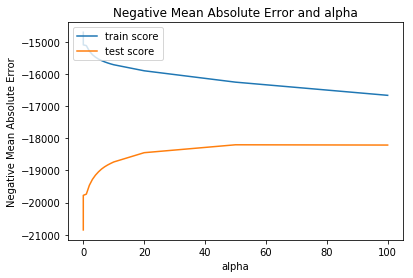

In [453]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

* From above plot and cv_results dataframe, we can see that Test score sort of stablizes around alpha=50 and the ranking of alfa=50 is 1st. Hence we will finalize 50 as our final value for hyperparameter.

In [454]:
alpha = 50
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([ 2106.16581701,  4230.73953149,  2583.79496104, -1124.16663168,
       -1118.21654186,  1804.47407419,   359.74340713,  5764.73090698,
        6811.96413405, -1104.2985701 ,  5399.15544156,   674.96708641,
       10802.4911771 ,   677.86275441,  4686.44230524, -1242.76279016,
       27537.97841468, -4973.22317239, -4616.99660199,  6840.46192954,
        3459.29080676,  3278.71456746,  -797.76542497,  7197.08760935,
        -396.89775351,  2013.74354969,  1604.87386474, -1722.83583923,
         494.76613479,  1169.93215654, -3280.20353071,  7451.56357627,
        -839.67683349,   497.30397727, 12414.53252589,   659.89525871,
         500.57000341,  -712.2461054 ,  9122.92974932,   205.63507018,
        -355.14432885, -3121.40331041,   -79.76326701, -2221.74912728,
        1187.16384403,  5126.13822087,   574.54372459,  2333.07645545,
        1268.20460639,  3779.53422305,  3866.25017509, -1545.91021855,
       -2384.2996924 ,  -666.43855695,  1956.24207501,  2269.22311437,
      

In [483]:
# predict using Ridge model
y_train_pred_ridge = ridge.predict(X_train)
print(r2_score(y_train, y_train_pred_ridge))
y_test_pred_ridge = ridge.predict(X_test)
print(r2_score(y_test, y_test_pred_ridge))

0.914518739191596
0.8766746320311195


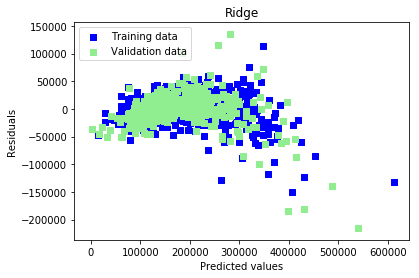

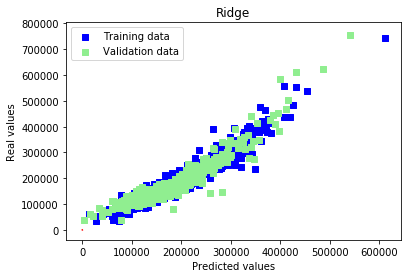

In [537]:
# Ridge model to test and train and checking residuals

  
# Plot residuals
plt.scatter(y_train_pred_ridge, y_train_pred_ridge - y_train, c = "blue", marker = "s", label = "Training data")
plt.scatter(y_test_pred_ridge, y_test_pred_ridge - y_test, c = "lightgreen", marker = "s", label = "Validation data")
plt.title("Ridge")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "upper left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")
plt.show()

# Plot predictions
plt.scatter(y_train_pred_ridge, y_train, c = "blue", marker = "s", label = "Training data")
plt.scatter(y_test_pred_ridge, y_test, c = "lightgreen", marker = "s", label = "Validation data")
plt.title("Ridge")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()  

## Lasso Regression

In [458]:
lasso = Lasso()

folds = KFold(n_splits=5, shuffle=True, random_state=100)

# Cross validations
lasso_model_cv = GridSearchCV(estimator=lasso,
                              param_grid=params,
                              scoring='neg_mean_absolute_error',                         
                              cv=folds,
                              verbose=1,
                              return_train_score=True)
lasso_model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   21.7s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
       error_score='raise',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_absolute_error', verbose=1)

In [464]:
cv_results_lasso = pd.DataFrame(lasso_model_cv.cv_results_)
cv_results_lasso = cv_results_lasso[cv_results_lasso['param_alpha']<=1000]
cv_results_lasso

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.282456,0.231672,0.000942,0.000227,0.0001,{'alpha': 0.0001},-20943.825596,-19392.464366,-20169.112432,-20585.827692,-23140.757459,-20844.134826,1256.657098,28,-14806.237711,-15102.648098,-14850.337841,-14852.096657,-13909.213633,-14704.106788,410.951469
1,0.164177,0.016166,0.000769,0.000007,0.001,{'alpha': 0.001},-20943.697735,-19391.513186,-20168.723090,-20585.742670,-23139.054918,-20843.484674,1256.300660,27,-14806.250460,-15102.660684,-14850.359992,-14852.097617,-13909.238285,-14704.121408,410.946653
2,0.164100,0.016194,0.000792,0.000026,0.01,{'alpha': 0.01},-20942.266968,-19382.005004,-20164.833734,-20584.892872,-23122.031126,-20836.954634,1252.743721,26,-14806.407659,-15102.808991,-14850.628896,-14852.161790,-13909.548889,-14704.311245,410.886839
3,0.164519,0.016555,0.000823,0.000060,0.05,{'alpha': 0.05},-20935.394747,-19339.101044,-20147.579379,-20581.154440,-23083.113050,-20815.033972,1250.568346,25,-14807.211802,-15103.510049,-14852.103553,-14852.617072,-13911.058406,-14705.300176,410.616749
4,0.162033,0.018499,0.000789,0.000024,0.1,{'alpha': 0.1},-20924.984346,-19291.654659,-20126.151629,-20576.794614,-23039.462651,-20789.592959,1248.378364,24,-14808.271582,-15104.414829,-14853.987249,-14853.210266,-13912.952929,-14706.567371,410.289407
5,0.165937,0.016707,0.000770,0.000024,0.2,{'alpha': 0.2},-20899.633848,-19223.044394,-20084.447743,-20567.594681,-23007.919587,-20754.307743,1257.855571,23,-14810.318742,-15106.246292,-14857.829298,-14854.388473,-13917.321942,-14709.220950,409.417141
6,0.162942,0.012713,0.000759,0.000009,0.3,{'alpha': 0.3},-20871.061545,-19180.650093,-20069.563240,-20562.057110,-22982.527003,-20730.953499,1260.275209,22,-14812.397381,-15107.921923,-14861.771090,-14855.505916,-13922.243593,-14711.967980,408.307313
7,0.167482,0.012695,0.000781,0.000042,0.4,{'alpha': 0.4},-20842.114215,-19151.056627,-20053.363312,-20550.316105,-22959.772127,-20709.107073,1260.856684,21,-14814.520577,-15110.233233,-14866.068504,-14856.817708,-13927.108616,-14714.949727,407.386899
8,0.169838,0.012370,0.000776,0.000027,0.5,{'alpha': 0.5},-20822.867133,-19121.817838,-20036.620242,-20540.213274,-22936.324848,-20689.354903,1261.359896,20,-14816.883766,-15112.239437,-14870.348480,-14859.063924,-13932.213939,-14718.149909,406.391792
9,0.180524,0.011470,0.000804,0.000041,0.6,{'alpha': 0.6},-20804.635453,-19092.786576,-20019.813170,-20530.079787,-22912.763876,-20669.805962,1261.832340,19,-14819.394406,-15115.595185,-14874.693104,-14861.566611,-13937.486825,-14721.747226,405.624818


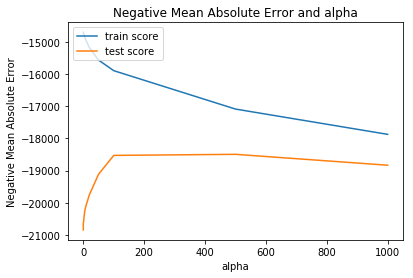

In [465]:
# plotting mean test and train scoes with alpha 
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

* From above plot and cv_results dataframe, we can see that Test score sort of stablizes around alpha=100 and the ranking of alfa=100 is 1st. Hence we will finalize 100 as our final value for hyperparameter.

In [505]:
alpha = 100
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
lasso.coef_

array([ 1951.42413209,  3775.38572563,  2246.41256828,  -939.87110305,
        -850.37929249,  1798.38315903,    99.26934705,  6093.04386471,
        7067.05085593, -1390.37548132,  4985.82086388,    -0.        ,
       10134.29935649,   449.4360747 ,   262.72927861, -1625.09231416,
       32237.29512544, -5400.24959447, -4574.19262222,  6630.9063242 ,
        3774.840372  ,  2428.26444162,  -358.15056745,  6624.37931043,
        -375.0345254 ,  1703.29746175,  1268.81672166, -1758.22363901,
         203.64936063,  1085.73590689, -3300.36245577,  7552.02489788,
        -330.67661076,   576.84243044, 12500.62909092,   356.18710189,
         260.26543081,  -397.49878914,  8361.04388515,    -0.        ,
        -177.03427038,  -399.91476732,    -0.        ,    -0.        ,
          -0.        ,  5851.91215335,     0.        ,     0.        ,
           0.        ,  3111.46612782,  2028.17933936,    -0.        ,
       -2756.9406228 ,    -0.        ,     0.        ,     0.        ,
      

In [506]:
# predict on Lasso model
y_train_pred_lasso = lasso.predict(X_train)
print(r2_score(y_train, y_train_pred_lasso))
trainr2=r2_score(y_train, y_train_pred_lasso)
y_test_pred_lasso = lasso.predict(X_test)
print(r2_score(y_test, y_test_pred_lasso))
testr2=r2_score(y_test, y_test_pred_lasso)

0.9133352637416902
0.8796593235783753


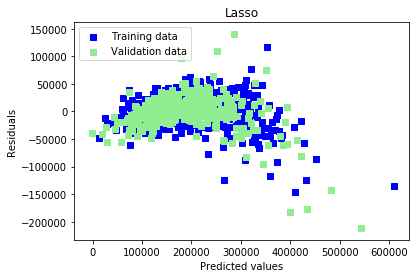

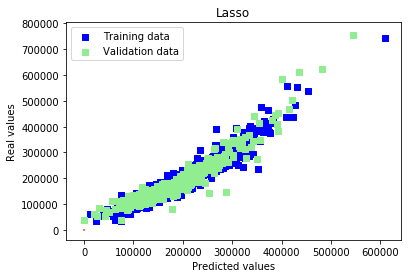

In [530]:
# Lasso model to test and train and checking residuals

  
# Plot residuals
plt.scatter(y_train_pred_lasso, y_train_pred_lasso - y_train, c = "blue", marker = "s", label = "Training data")
plt.scatter(y_test_pred_lasso, y_test_pred_lasso - y_test, c = "lightgreen", marker = "s", label = "Validation data")
plt.title("Lasso")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "upper left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")
plt.show()

# Plot predictions
plt.scatter(y_train_pred_lasso, y_train, c = "blue", marker = "s", label = "Training data")
plt.scatter(y_test_pred_lasso, y_test, c = "lightgreen", marker = "s", label = "Validation data")
plt.title("Lasso")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()  

Lasso picked 93 features and eliminated the other 99 features


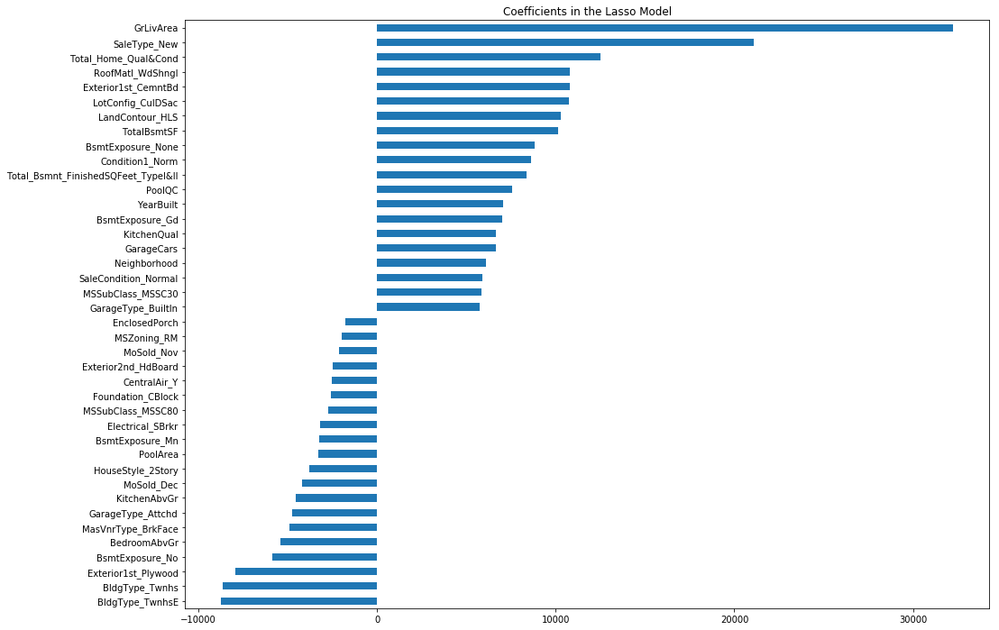

In [507]:
fig = plt.figure(figsize=(16,12))
coefs = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
      str(sum(coefs == 0)) + " features")
imp_coefs = pd.concat([coefs.sort_values().head(20),
                     coefs.sort_values().tail(20)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")
plt.show()

In [508]:
# Adjusted R2 calculation on train
adjr2_train = 1-(1-trainr2)*(X_train.shape[0]-1)/(X_train.shape[0]-sum(coefs != 0)-1)
adjr2_train

0.9045745893155784

In [509]:
# Adjusted R2 calculation on test
adjr2_test = 1-(1-testr2)*(X_test.shape[0]-1)/(X_test.shape[0]-sum(coefs != 0)-1)
adjr2_test

0.8468391390997504

## RFE model to choose top 40 features

In [513]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# specify range of hyperparameters
hyper_params = [{'n_features_to_select': list(range(2, 40))}]

# specify model
rfe = RFE(lasso)             

# set up GridSearchCV()
rfe_model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
rfe_model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 38 candidates, totalling 190 fits


[Parallel(n_jobs=1)]: Done 190 out of 190 | elapsed:  7.8min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
       error_score='raise',
       estimator=RFE(estimator=Lasso(alpha=100, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
  n_features_to_select=None, step=1, verbose=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'n_features_to_select': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='r2', verbose=1)

In [514]:
rfe_cv_results = pd.DataFrame(rfe_model_cv.cv_results_)
rfe_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.461608,0.266158,0.000965,0.000153,2,{'n_features_to_select': 2},0.144178,0.534419,0.225368,0.147198,0.146220,0.239569,0.150700,38,0.138900,0.634754,0.182022,0.124030,0.204777,0.256897,0.191142
1,3.049252,0.413419,0.000960,0.000224,3,{'n_features_to_select': 3},0.630197,0.588254,0.695512,0.473635,0.692470,0.615938,0.081747,37,0.617949,0.672713,0.650841,0.648407,0.641484,0.646279,0.017605
2,3.165779,0.688675,0.001394,0.000623,4,{'n_features_to_select': 4},0.714378,0.678839,0.762320,0.539417,0.692625,0.677501,0.074670,36,0.737673,0.761349,0.736674,0.683966,0.646143,0.713161,0.041999
3,2.704870,0.511656,0.000884,0.000074,5,{'n_features_to_select': 5},0.704371,0.699853,0.762844,0.526856,0.736501,0.686035,0.082865,35,0.744468,0.778220,0.740263,0.712321,0.754615,0.745978,0.021363
4,2.465815,0.288199,0.000890,0.000047,6,{'n_features_to_select': 6},0.770987,0.706557,0.795239,0.696076,0.780283,0.749799,0.040503,34,0.798978,0.780872,0.805269,0.778012,0.816780,0.795982,0.014690
5,2.339404,0.220652,0.000892,0.000039,7,{'n_features_to_select': 7},0.772584,0.704286,0.830539,0.696430,0.820133,0.764740,0.056179,33,0.801879,0.782222,0.844646,0.783487,0.847271,0.811901,0.028677
6,2.349392,0.232798,0.000895,0.000070,8,{'n_features_to_select': 8},0.772739,0.698892,0.826952,0.775361,0.817037,0.778158,0.045200,32,0.804757,0.787114,0.847951,0.817174,0.848960,0.821191,0.024227
7,2.349656,0.223179,0.000854,0.000008,9,{'n_features_to_select': 9},0.772608,0.776594,0.829755,0.774980,0.816021,0.793970,0.024026,31,0.806225,0.837771,0.853147,0.817679,0.851677,0.833300,0.018594
8,2.376821,0.226799,0.000910,0.000101,10,{'n_features_to_select': 10},0.818204,0.777589,0.830047,0.830267,0.816925,0.814604,0.019360,30,0.843042,0.840297,0.854262,0.847038,0.853352,0.847598,0.005511
9,2.470541,0.203505,0.000861,0.000019,11,{'n_features_to_select': 11},0.826053,0.816493,0.833786,0.837017,0.819229,0.826523,0.007962,29,0.864359,0.858231,0.855181,0.849366,0.863828,0.858193,0.005599


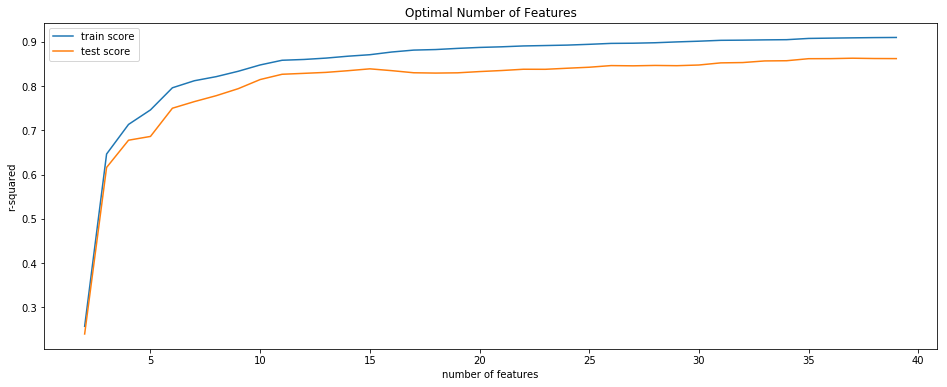

In [516]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(rfe_cv_results['param_n_features_to_select'], rfe_cv_results['mean_train_score'])
plt.plot(rfe_cv_results['param_n_features_to_select'], rfe_cv_results['mean_test_score'])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [518]:
rfe = RFE(lasso, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [519]:
rfe_var = list(zip(X_train, rfe.support_, rfe.ranking_))
rfe_df = pd.DataFrame(rfe_var, columns=['Features', 'Support', 'Ranking'])
rfe_df.sort_values(by=['Ranking'], inplace=True)
rfe_df

,Features,Support,Ranking
107,Exterior1st_CemntBd,True,1
156,GarageType_BuiltIn,True,1
12,TotalBsmtSF,True,1
45,MSSubClass_MSSC30,True,1
143,BsmtExposure_None,True,1
140,BsmtExposure_Gd,True,1
16,GrLivArea,True,1
8,YearBuilt,True,1
34,Total_Home_Qual&Cond,True,1
62,LotConfig_CulDSac,True,1


In [521]:
rfe_col = X_train.columns[rfe.support_]
rfe_col

Index(['Neighborhood', 'YearBuilt', 'TotalBsmtSF', 'GrLivArea',
       'Total_Home_Qual&Cond', 'Total_Bsmnt_FinishedSQFeet_TypeI&II',
       'MSSubClass_MSSC30', 'LandContour_HLS', 'LotConfig_CulDSac',
       'Exterior1st_CemntBd', 'Exterior1st_Plywood', 'BsmtExposure_Gd',
       'BsmtExposure_None', 'GarageType_BuiltIn', 'SaleType_New'],
      dtype='object')

In [522]:
# Building Linear Model to check AIC and Adj. R^2
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train[rfe_col])
final_lm = sm.OLS(y_train,X_train_lm)
res = final_lm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.871
Method:                 Least Squares   F-statistic:                     458.1
Date:                Sun, 07 Jul 2019   Prob (F-statistic):               0.00
Time:                        23:11:13   Log-Likelihood:                -11799.
No. Observations:                1014   AIC:                         2.363e+04
Df Residuals:                     998   BIC:                         2.371e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
const                                1.725e+05   1083.799    159.183      0.000     1.7e+05    1.75e+05
Neighborhood                         1.038e+04   1382.669      7.505      0.000    7663.495    1.31e+04
YearBuilt                            1.062e+04   1337.957      7.938      0.000    7995.300    1.32e+04
TotalBsmtSF                          1.571e+04   1290.178     12.176      0.000    1.32e+04    1.82e+04
GrLivArea                            3.322e+04   1157.648     28.699      0.000     3.1e+04    3.55e+04
Total_Home_Qual&Cond                   1.8e+04   1025.447     17.557      0.000     1.6e+04       2e+04
Total_Bsmnt_FinishedSQFeet_TypeI&II  1.109e+04   1055.512     10.508      0.000    9020.479    1.32e+04
MSSubClass_MSSC30                    2.312e+04   4615.164      5.009      0.000    1.41e+04    3.22e+04
LandContour_HLS                      1.349e+04   4975.141      2.711      0.007    3725.681    2.33e+04
LotConfig_CulDSac                     1.36e+04   3742.871      3.634      0.000    6258.337    2.09e+04
Exterior1st_CemntBd                  1.155e+04   4662.618      2.478      0.013    2402.090    2.07e+04
Exterior1st_Plywood                 -1.325e+04   3475.883     -3.812      0.000   -2.01e+04   -6429.189
BsmtExposure_Gd                      1.801e+04   3469.827      5.192      0.000    1.12e+04    2.48e+04
BsmtExposure_None                    3.378e+04   6538.581      5.166      0.000    2.09e+04    4.66e+04
GarageType_BuiltIn                   1.648e+04   3911.675      4.212      0.000    8801.643    2.42e+04
SaleType_New                         3.224e+04   3590.893      8.979      0.000    2.52e+04    3.93e+04
==============================================================================
Omnibus:                      249.401   Durbin-Watson:                   2.020
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1786.031
Skew:                           0.930   Prob(JB):                         0.00
Kurtosis:                       9.230   Cond. No.                         12.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [527]:
X_test_lm = sm.add_constant(X_test[rfe_col])
y_test_pred = res.predict(X_test_lm)

In [529]:
testr2 = r2_score(y_test, y_test_pred)
testr2

0.8527878053107143

## Final Set Of Features That Can Be Used For Interpretation

In [ ]:
'Neighborhood',
'YearBuilt',
'TotalBsmtSF',
'GrLivArea',
'Total_Home_Qual&Cond',  --> This is s derived feature combining both the Home Quality and Condition features
'Total_Bsmnt_FinishedSQFeet_TypeI&II',  --> This is s derived feature combining both the Bsmnt_FinishTypeI and Bsmnt_FinishTypeII features
'MSSubClass_MSSC30',   --> This represents '1-STORY 1945 & OLDER' class of MSSUBCLASS feature
'LandContour_HLS',
'LotConfig_CulDSac',
'Exterior1st_CemntBd',
'Exterior1st_Plywood',
'BsmtExposure_Gd',
'BsmtExposure_None',
'GarageType_BuiltIn',
'SaleType_New'